In [202]:
# libraries for querying astro images and processing them
from astroquery.alma import Alma
from astroquery.skyview import SkyView
from astropy.io import fits
from astropy.visualization import astropy_mpl_style
from astropy.modeling import models, fitting
from astropy.convolution import convolve, interpolate_replace_nans
from astropy.convolution import Gaussian2DKernel 
from astropy.stats import sigma_clip, sigma_clipped_stats
import os
import skimage
from skimage.filters import *
import numpy as np
from skimage import io, exposure, morphology, filters, feature
from skimage.feature import blob_dog, blob_log, blob_doh
import cv2
from math import sqrt
import scipy.optimize as opt
import statmorph
import photutils
import scipy.ndimage as ndi
import pandas as pd
from scipy import ndimage

# plotting libraries
import pylab as py
import matplotlib.pyplot as plt
from matplotlib import colors

# libraries for machine learning
from sklearn import decomposition
from sklearn import preprocessing


# random libraries
import time
import math
import warnings
import pickle

plt.style.use(astropy_mpl_style)

In [2]:
rcsed = fits.open('joined_rcsed_gz2.fits')
data = rcsed[1].data

In [3]:
NO_GALAXY = 200 # number of galaxies to be downloaded
NO_PIXELS_IMAGE = 150 # number of pixels of download galaxy images from SkyView


In [4]:
ra_data = data['ra_1'][0:NO_GALAXY]
dec_data = data['dec_1'][0:NO_GALAXY]
not_edge_on_bool_data = data['t02_edgeon_a05_no_flag'][0:NO_GALAXY]

columns = (ra_data, dec_data, not_edge_on_bool_data)

cleaned_array = np.column_stack(columns)
cleaned_data = pd.DataFrame(cleaned_array, columns = ['RA', 'DEC', 'not_edge_on_bool'])

In [5]:
cleaned_data['radec'] = cleaned_data['RA'].astype(str) + ',' + cleaned_data['DEC'].astype(str)

faceon_data = cleaned_data[cleaned_data['not_edge_on_bool'] == 1]

def get_image(radec):
        req = SkyView.get_images(position=radec, survey=['SDSSi'], pixels=NO_PIXELS_IMAGE,)
        img = req[0][0].data.copy()
        return img



In [6]:
def download_image(row):
    radec = row['radec']
    img = get_image(radec)
    return img

faceon_data['image'] = faceon_data.apply(download_image, axis=1)


C:\Users\lohdi\AppData\Local\Temp\ipykernel_1028\2444236901.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  faceon_data['image'] = faceon_data.apply(download_image, axis=1)


In [7]:
BAD_IMAGE_FILTER = 675

def check_image(row):
    img = row['image']
    if np.count_nonzero(img==0) >= BAD_IMAGE_FILTER:
        return 0
    else:
        return 1

faceon_data['is_good_image'] = faceon_data.apply(check_image, axis=1)
faceon_data_nonan = faceon_data[faceon_data['is_good_image'] == 1]


C:\Users\lohdi\AppData\Local\Temp\ipykernel_1028\2732901746.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  faceon_data['is_good_image'] = faceon_data.apply(check_image, axis=1)


In [9]:
galaxy_images = {}    

for row in faceon_data_nonan.itertuples(index=False, name=None):
    
    radec = row[3]
    img = get_image(radec)
    
    with open('original_images_pickle/{}.pickle'.format(radec), 'wb') as f:
        pickle.dump(img, f, pickle.HIGHEST_PROTOCOL)
        
    galaxy_images[radec] = img
    

In [10]:
import os

directory = 'original_images_pickle'

galaxy_images = {}

for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        with open(f, 'rb') as file:
            img = pickle.load(file)
            gal = filename.replace('.pickle', '')
            galaxy_images[gal] = img

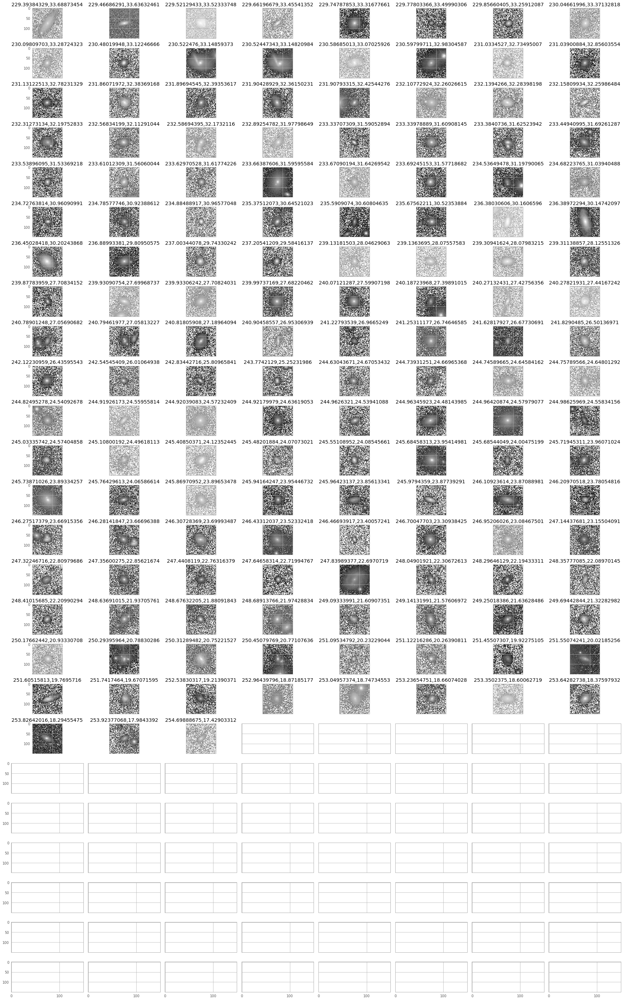

In [11]:
fig, axes = plt.subplots(25, 8, figsize=(25, 40), sharex=True, sharey=True)
ax = axes.ravel()

i = 0

for galaxy, original_img_data in galaxy_images.items():
#     norm = colors.LogNorm(original_img_data.mean() + 0.5 * original_img_data.std(), original_img_data.max(), clip='True')
    norm = colors.LogNorm()
    ax[i].set_title(galaxy)
    ax[i].imshow(original_img_data, norm=norm, cmap='gray')
    
    print(i, end='\r')
    i += 1
    

plt.tight_layout()
plt.show()

In [10]:
for galaxy, original_img_data in galaxy_images.items():
    print(original_img_data)
    break

[[ 0  4  0 ...  2  0 12]
 [ 0  0  4 ...  1  3  5]
 [ 3  2  3 ...  4  3  3]
 ...
 [ 9  9  0 ...  0  2  0]
 [ 9 15  7 ...  3 10  0]
 [12  0  4 ... 11 11  0]]


In [14]:
import warnings
warnings.filterwarnings('ignore')

from skimage import transform
import skimage
import random
from math import cos, sin

gain = 10000.0 # editable parameter

#PSF 
size = 20  # on each side from the center
sigma_psf = 2.0
y, x = np.mgrid[-size:size+1, -size:size+1]
psf = np.exp(-(x**2 + y**2)/(2.0*sigma_psf**2))
psf /= np.sum(psf)

i = 0

sersic_fits = {}

for galaxy, original_img_data in galaxy_images.items():
    mean = np.nanmean(original_img_data)
    std = np.nanstd(original_img_data)
    
    image = original_img_data.copy()
    norm = colors.LogNorm()
    
    threshold = photutils.detect_threshold(image, 1.5)
    npixels = 5  # minimum number of connected pixels
    segm = photutils.detect_sources(image, threshold, npixels)

    # Keep only the largest segment
    label = np.argmax(segm.areas) + 1
    segmap = segm.data == label

    segmap_float = ndi.uniform_filter(np.float64(segmap), size=10)
    segmap = segmap_float > 0.5
    
#     rotated_image = transform.rotate(original_img_data.byteswap().newbyteorder(), float(nsa_ang[i]),
#                                     mode='constant', cval=np.NaN)
   
#     for u in range(rotated_image.shape[0]):
#         for v in range(rotated_image.shape[1]):
#             if bool(np.isnan(rotated_image[u][v])):
#                 rotated_image[u][v] = random.gauss(mean, std)

    source_morphs = statmorph.source_morphology(image, segmap.astype(int), gain=gain, psf=psf)

    morph = source_morphs[0]
    
    ny, nx = image.shape
    y, x = np.mgrid[0:ny, 0:nx]
    fitted_model = statmorph.ConvolvedSersic2D(amplitude=morph.sersic_amplitude,
                                                r_eff=morph.sersic_rhalf,
                                                n=morph.sersic_n,
                                                x_0=morph.sersic_xc,
                                                y_0=morph.sersic_yc,
                                                ellip=morph.sersic_ellip,
                                                theta=morph.sersic_theta)
    
    fitted_model.set_psf(psf)  # required when using ConvolvedSersic2D
    image_model = fitted_model(x, y)
    
    theta = morph.sersic_theta
    rhalfellip = morph.rhalf_ellip
    rmaj = morph.sersic_rhalf
    rhalf_circ = morph.rhalf_circ
    r20 = morph.r20
    r50 = morph.r50
    r80 = morph.r80
    rmax_circ = morph.rmax_circ
    rmax_ellip = morph.rmax_ellip
    rpetro_circ = morph.rpetro_circ
    rpetro_ellip = morph.rpetro_ellip
    ellip = morph.sersic_ellip
    rmin = rmaj - (rmaj * ellip)
    
    sersic_fits[galaxy] = [original_img_data, image_model, theta, rhalfellip, rmaj, rhalf_circ, r20, r50, r80, 
                           rmax_circ, rmax_ellip, rpetro_circ, rpetro_ellip, ellip, rmin]
    
    print(i, end='\r')
    
    i += 1


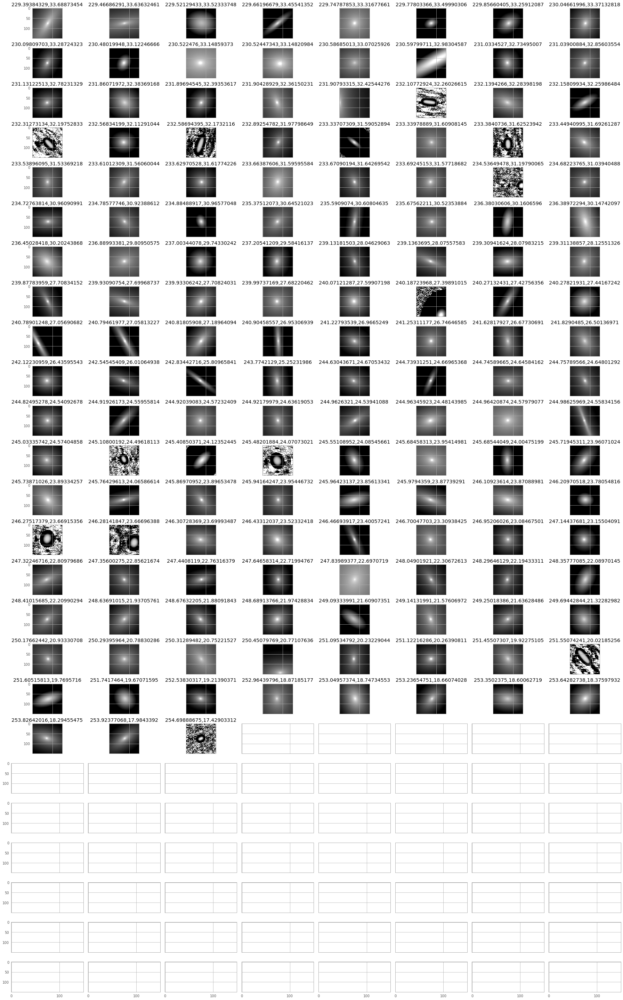

In [18]:
fig, axes = plt.subplots(25, 8, figsize=(25, 40), sharex=True, sharey=True)
ax = axes.ravel()

i = 0

for galaxy, model in sersic_fits.items():
    
    profile = model[1]
    ax[i].set_title(galaxy)
    ax[i].imshow(profile, cmap='gray', norm=norm)
    
    print(i, end='\r')
    i += 1
    
plt.tight_layout()
plt.show()

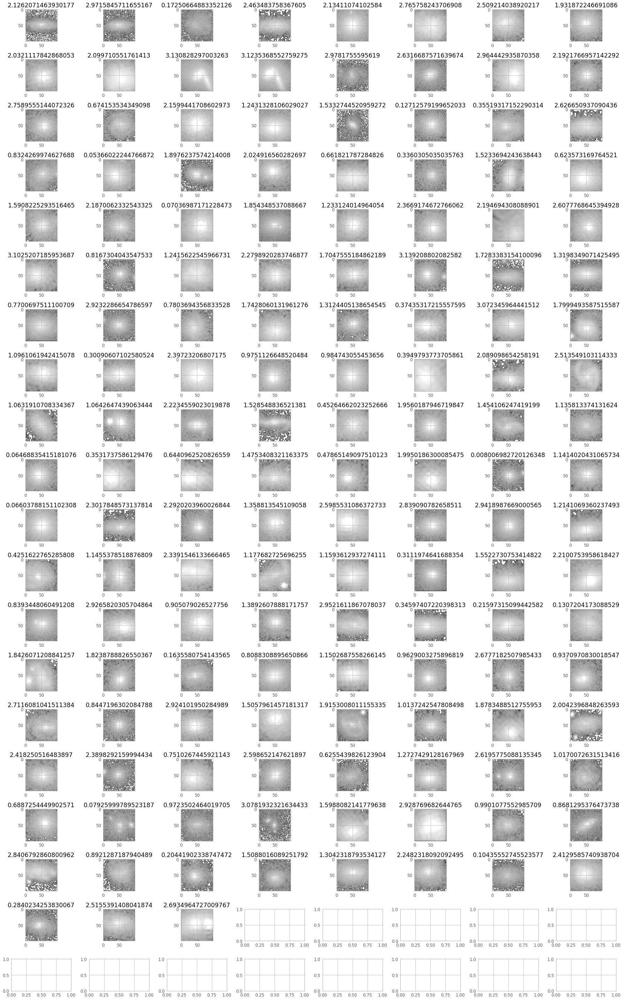

In [220]:
fig, axes = plt.subplots(20, 8, figsize=(25, 40), sharex=False, sharey=False)
ax = axes.ravel()

def crop_center(img, mask_constant, rad):
    y, x = img.shape
    rmask = mask_constant * rad
    
    while rmask > y/2 or rmask > x/2:
        mask_constant -= 1
        rmask = mask_constant * rad
         
    startx = x//2 - rmask
    starty = y//2 - rmask   
    endx = startx + (rmask * 2)
    endy = starty + (rmask * 2)

    return img[starty:endy, startx:endx]


MASK_CONSTANT = 1
FINAL_RESOLUTION_PIXELS = 100

i = 0

processed_galaxies = {}

for galaxy, model in sersic_fits.items():
    
    
    masked_image = model[0].copy()
    # sersic_fits[galaxy] = [original_img_data, image_model, theta, rhalfellip, rmaj, rhalf_circ, r20, r50, r80, 
                          # rmax_circ, rmax_ellip, rpetro_circ, rpetro_ellip, ellip, rmin]

    # sigma clipping
    sigmean, sigmed, sigstd = sigma_clipped_stats(masked_image, sigma=3)
    # rotation
    angle = model[2]
    masked_image = ndimage.rotate(masked_image, angle*180/math.pi, cval=sigmean)
    

#     # gaussian smooting
#     masked_image = ndimage.gaussian_filter(masked_image, sigma=1)
    
    r80 = round(model[8])
    rhalfellip = round(model[7])
    masked_image = crop_center(masked_image, MASK_CONSTANT, r80) 
    
    try:
        zoom_factor = FINAL_RESOLUTION_PIXELS/round(masked_image.shape[1])
    except:
    
        zoom_factor = 1
    
    masked_image = ndimage.zoom(masked_image, zoom_factor)
    
    # preprocess and scale each image's pixel values
    
    model.append(masked_image)
    processed_galaxies[galaxy] = model

    ax[i].set_title(angle)
    ax[i].imshow(masked_image, cmap='gray', norm=norm)

    print(i, end='\r')
    i += 1

plt.tight_layout()
plt.show()

In [221]:
## code for flattening and conducting PCA on images


# create data matrix

data_list = []

for galaxy, item in processed_galaxies.items():
    img = item[-1]
    
    # preprocess and scale each image's pixel values
    transformer = preprocessing.MinMaxScaler().fit(img)
    img_scaled = transformer.transform(img)
    
    print(img_scaled)                                                                                               
    data_row = img_scaled.flatten()
    data_list.append(data_row)
    
data_matrix = np.vstack(data_list)


[[0.16093585 0.30029547 0.23554365 ... 0.15583988 0.21020707 0.12888062]
 [0.26776662 0.20566835 0.         ... 0.2514726  0.27125558 0.23998189]
 [0.28982896 0.29926446 0.2947368  ... 0.20298485 0.13798681 0.13293964]
 ...
 [0.10153967 0.2270591  0.51724076 ... 0.37964505 0.4101246  0.27387887]
 [0.00685361 0.06559336 0.47591352 ... 0.27341    0.28516817 0.23632571]
 [0.18765123 0.17249873 0.5202009  ... 0.2508368  0.2618125  0.24807136]]
[[0.33216247 0.3267269  0.21908917 ... 0.35694098 0.21384855 0.1215442 ]
 [0.41261035 0.3913259  0.27482256 ... 0.19059798 0.11536312 0.09522402]
 [0.52455896 0.50571126 0.39124435 ... 0.03790748 0.         0.04105039]
 ...
 [0.5711527  0.4571145  0.21222796 ... 0.44368964 0.3419447  0.21901856]
 [0.5617629  0.47411788 0.26847777 ... 0.28070718 0.3210703  0.32472068]
 [0.5723481  0.49260512 0.2862105  ... 0.08626029 0.27556494 0.41624933]]
[[0.30653292 0.4897027  0.5864874  ... 0.7607121  0.47093332 0.18462102]
 [0.26354188 0.40356147 0.58660233 ... 

[[0.10935177 0.08014357 0.10942672 ... 0.07720219 0.16254877 0.22157286]
 [0.12410413 0.09782802 0.12964486 ... 0.09365974 0.16677365 0.21999662]
 [0.16307925 0.14166793 0.17462099 ... 0.1306459  0.17736852 0.21796885]
 ...
 [0.21755165 0.21916217 0.28627384 ... 0.03742873 0.01555812 0.03246678]
 [0.06792428 0.0693194  0.15725528 ... 0.0116725  0.03703985 0.07334584]
 [0.         0.         0.0949787  ... 0.         0.04788128 0.09345673]]
[[0.5776535  0.59558356 0.48208305 ... 0.09689038 0.44222608 0.5912772 ]
 [0.49374598 0.5032746  0.40742064 ... 0.20649818 0.49387285 0.61492753]
 [0.3343474  0.33599862 0.28606346 ... 0.43634573 0.6006544  0.66130316]
 ...
 [0.32555535 0.20724994 0.         ... 0.36536676 0.45288092 0.49204478]
 [0.32454273 0.22305188 0.03956816 ... 0.23447883 0.15556388 0.16623297]
 [0.32731882 0.2397239  0.07409662 ... 0.15502131 0.         0.        ]]
[[0.20917681 0.1971466  0.15947282 ... 0.04228099 0.03061445 0.02614355]
 [0.20232084 0.19129258 0.15642473 ... 

In [222]:
# conduct PCA

NO_COMPONENTS = data_matrix.shape[0]

pca = decomposition.PCA(n_components=NO_COMPONENTS)
pca.fit(data_matrix)

pca_matrix = pca.components_[:NO_COMPONENTS]

print(pca.explained_variance_ratio_)
print(pca.components_)

[2.93218851e-01 8.92290697e-02 6.02566861e-02 5.29944077e-02
 4.19326574e-02 3.25178429e-02 2.46521924e-02 2.26253420e-02
 1.99882239e-02 1.62238237e-02 1.52408127e-02 1.21595804e-02
 1.13054635e-02 1.05448635e-02 9.52408090e-03 8.95387586e-03
 8.12913291e-03 7.23602530e-03 7.20169302e-03 6.77530281e-03
 6.65924093e-03 6.38773665e-03 6.11023419e-03 5.97961759e-03
 5.47963753e-03 5.24643715e-03 5.01000369e-03 4.71757678e-03
 4.65859659e-03 4.61258413e-03 4.44463966e-03 4.39429795e-03
 4.30302229e-03 4.12395364e-03 4.08094050e-03 3.94189591e-03
 3.85707803e-03 3.74332117e-03 3.68598383e-03 3.63546284e-03
 3.56418989e-03 3.52025288e-03 3.38904583e-03 3.36457859e-03
 3.27512319e-03 3.23395059e-03 3.11753852e-03 3.05152172e-03
 2.97158724e-03 2.94328341e-03 2.86169536e-03 2.81441119e-03
 2.71472568e-03 2.69501610e-03 2.64518405e-03 2.61982554e-03
 2.59114383e-03 2.55062128e-03 2.52674543e-03 2.46983673e-03
 2.40767631e-03 2.29173643e-03 2.28227396e-03 2.26204121e-03
 2.23411014e-03 2.201663

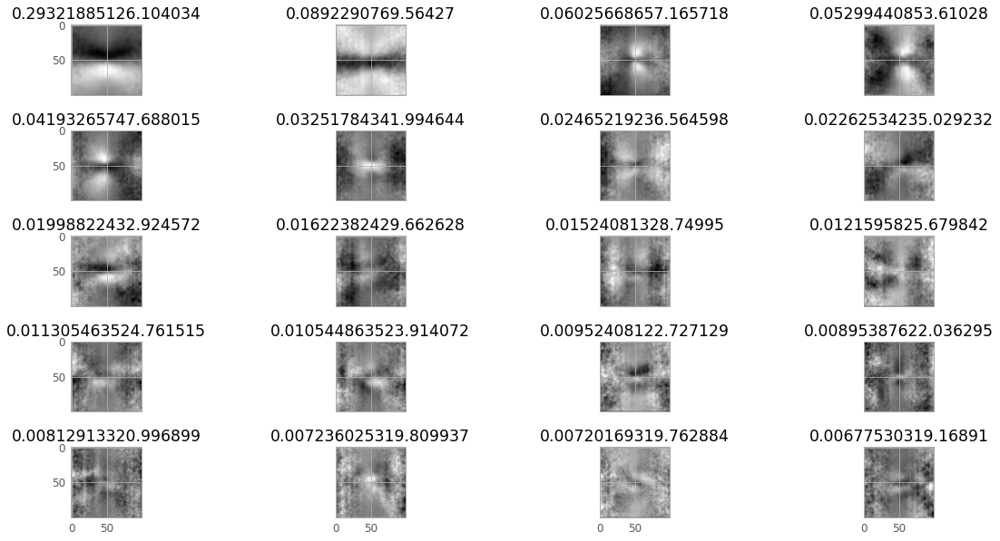

In [229]:
# plot PCA components
fig, axes = plt.subplots(5, 4, figsize=(20, 10), sharex=True, sharey=True)
ax = axes.ravel()

i = 0

for row, var, val in zip(pca_matrix, pca.explained_variance_ratio_, pca.singular_values_):
    component = row.reshape([100, 100])
    ax[i].set_title(str(var) + str(val))
    ax[i].imshow(component, cmap='gray')

    print(i, end='\r')
    i += 1
    if i == 20:
        break


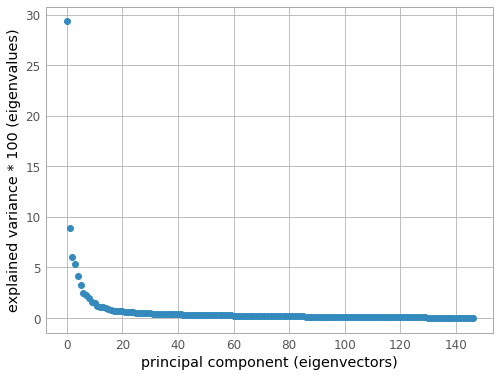

In [228]:
# reconstruct original images from components

x = list(range(0, 147))
y = (pca.explained_variance_ratio_*100).tolist()

plt.xlabel('principal component (eigenvectors)')
plt.ylabel('explained variance * 100 (eigenvalues)')
plt.scatter(x, y)

In [102]:
# conduct NMF

NO_COMPONENTS = data_matrix.shape[0]

nmf = decomposition.NMF(n_components=NO_COMPONENTS)
nmf.fit(data_matrix)

nmf_matrix = nmf.components_[:NO_COMPONENTS]



In [ ]:
print(nmf_matrix)

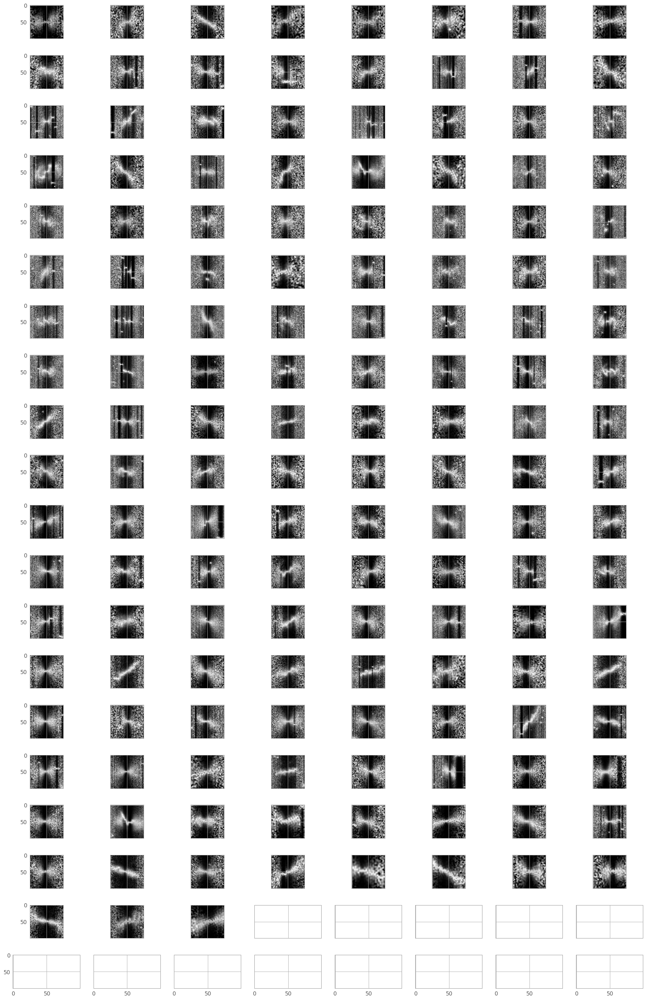

In [103]:
# plot NMF components
fig, axes = plt.subplots(20, 8, figsize=(25, 40), sharex=True, sharey=True)
ax = axes.ravel()

i = 0

for row in nmf_matrix:
    component = row.reshape([100, 100])
    ax[i].imshow(component, cmap='gray',)

    print(i, end='\r')
    i += 1


AttributeError: 'NMF' object has no attribute 'explained_Variance_ratio_'

In [ ]:
fig, axes = plt.subplots(25, 8, figsize=(25, 40), sharex=True, sharey=True)
ax = axes.ravel()

MASK_CONSTANT = 4

i = 0

for galaxy, model in sersic_fits.items():
    
    masked_image = model[0].copy()
    rhalfellip = model[2]
    rmask = MASK_CONSTANT * rhalfellip
    try:
        for ii in range(masked_image.shape[0]):
            for jj in range(masked_image.shape[1]):
                x = ii - masked_image.shape[0]/2
                y = jj - masked_image.shape[1]/2
                if ((x**2)+(y**2))**0.5 > rmask:
                    masked_image[ii][jj] = np.NaN
    except:
        pass

    
    background_image = model[0].copy()
    
    try:
         for ii in range(background_image.shape[0]):
            for jj in range(background_image.shape[1]):
                x = ii - background_image.shape[0]/2
                y = jj - background_image.shape[1]/2
                if ((x**2)+(y**2))**0.5 <= rmask:
                    background_image[ii][jj] = np.NaN
                    
    except:
        pass
    
    mean = np.nanmean(background_image)
    std = np.nanstd(background_image)
    for ii in range(masked_image.shape[0]):
        for jj in range(masked_image.shape[1]):
            if bool(np.isnan(masked_image[ii][jj])):
                masked_image[ii][jj] = random.gauss(mean, std)

    
    
    ax[i].set_title(galaxy)
    ax[i].imshow(masked_image, cmap='gray')
    
    print(i, end='\r')
    i += 1
    
plt.tight_layout()
plt.show()

In [8]:
import os

directory = 'original_images'

galaxy_images = {}

for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        gal = str(f).replace("original_images\\", '')
        gal = gal.replace('.jpg', '')
        galaxy_images[gal] = img

In [15]:
galaxy_images = {}    

for row in faceon_data.itertuples(index=False, name=None):
    radec = row[3]
    img = get_image(radec)
    result = cv2.imwrite('original_images/{}.jpg'.format(radec), img*255)
    galaxy_images[radec] = img
    
    
    if result == True:
        continue
    else:
        print('Failed to save image')
    

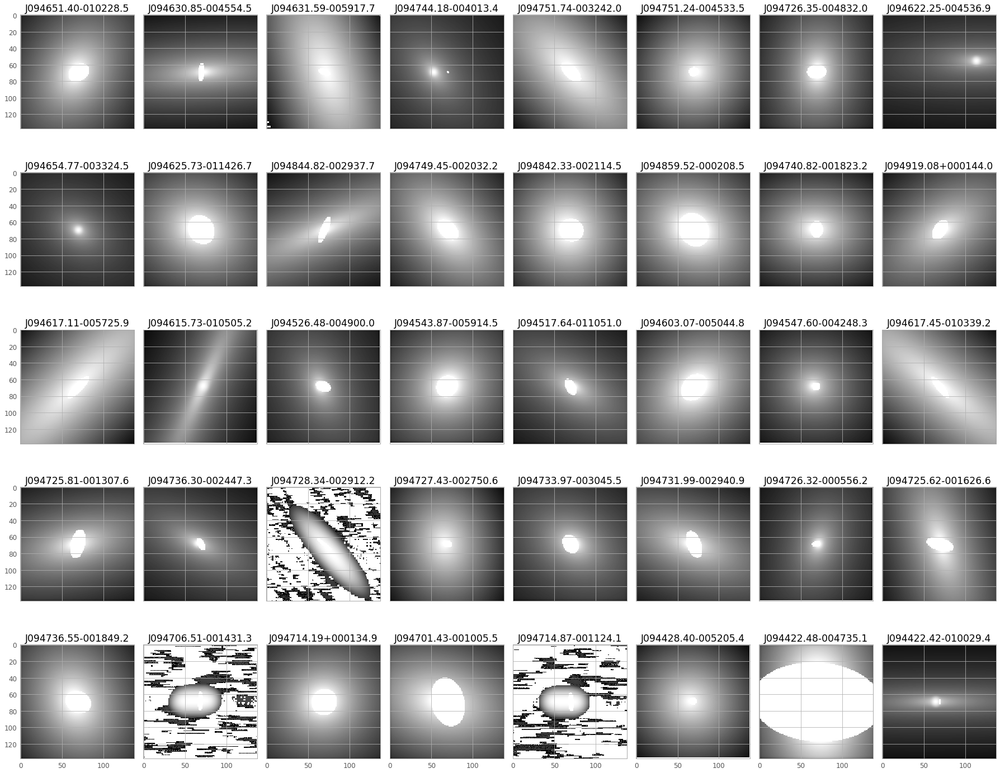

In [51]:
import warnings
warnings.filterwarnings('ignore')

fig, axes = plt.subplots(5, 8, figsize=(25, 20), sharex=True, sharey=True)
ax = axes.ravel()
i = 0

from skimage import transform
import skimage
import random
from math import cos, sin

gain = 10000 # editable parameter

#PSF 
size = 20  # on each side from the center
sigma_psf = 2.0
y, x = np.mgrid[-size:size+1, -size:size+1]
psf = np.exp(-(x**2 + y**2)/(2.0*sigma_psf**2))
psf /= np.sum(psf)
plt.imshow(psf, origin='lower', cmap='gray')


for galaxy, original_img_data in nsa_galaxy_images.items():
    mean = np.nanmean(original_img_data)
    std = np.nanstd(original_img_data)
    
    
    
    image = original_img_data.copy()
    norm = colors.LogNorm()
    
    threshold = photutils.detect_threshold(image, 1.5)
    npixels = 5  # minimum number of connected pixels
    segm = photutils.detect_sources(image, threshold, npixels)


    label = np.argmax(segm.areas) + 1
    segmap = segm.data == label    
    
    segmap_float = ndi.uniform_filter(np.float64(segmap), size=10)
    segmap = segmap_float > 0.5

#     rotated_image = transform.rotate(original_img_data.byteswap().newbyteorder(), float(nsa_ang[i]),
#                                     mode='constant', cval=np.NaN)
   
#     for u in range(rotated_image.shape[0]):
#         for v in range(rotated_image.shape[1]):
#             if bool(np.isnan(rotated_image[u][v])):
#                 rotated_image[u][v] = random.gauss(mean, std)

    source_morphs = statmorph.source_morphology(image, segmap, gain=gain, psf=psf)

    morph = source_morphs[0]
    
    ny, nx = image.shape
    y, x = np.mgrid[0:ny, 0:nx]
    fitted_model = statmorph.ConvolvedSersic2D(amplitude=morph.sersic_amplitude,
                                                r_eff=morph.sersic_rhalf,
                                                n=morph.sersic_n,
                                                x_0=morph.sersic_xc,
                                                y_0=morph.sersic_yc,
                                                ellip=morph.sersic_ellip,
                                                theta=morph.sersic_theta)
    
    fitted_model.set_psf(psf)  # required when using ConvolvedSersic2D
    image_model = fitted_model(x, y)
    
    theta = morph.sersic_theta
    rmaj = morph.sersic_rhalf
    ellip = morph.sersic_ellip
    rmin = rmaj - (rmaj * ellip)
    
    for ii in range(image.shape[0]):
        for jj in range(image.shape[1]):
            x = ii - image_model.shape[0]/2
            y = jj - image_model.shape[1]/2
            if ((x*cos(theta)+y*sin(theta))/rmaj)**2 + ((x*sin(theta)-y*cos(theta))/rmin)**2 < 1:
                image_model[ii][jj] = np.NaN
    
    ax[i].set_title(galaxy)
    ax[i].imshow(image_model, cmap='gray', norm=norm)
    i += 1
    
    
plt.tight_layout()
plt.show()

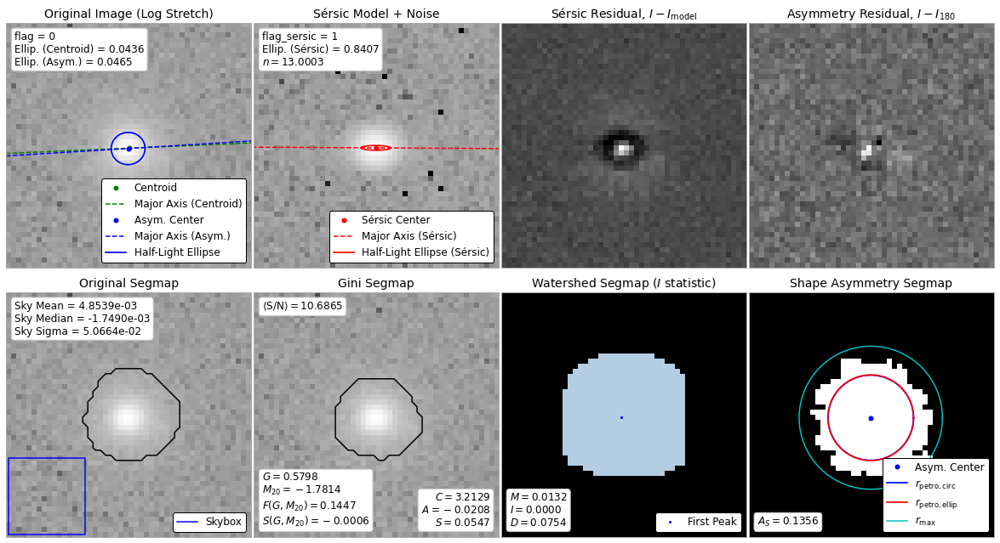

In [44]:
from statmorph.utils.image_diagnostics import make_figure
fig = make_figure(morph)

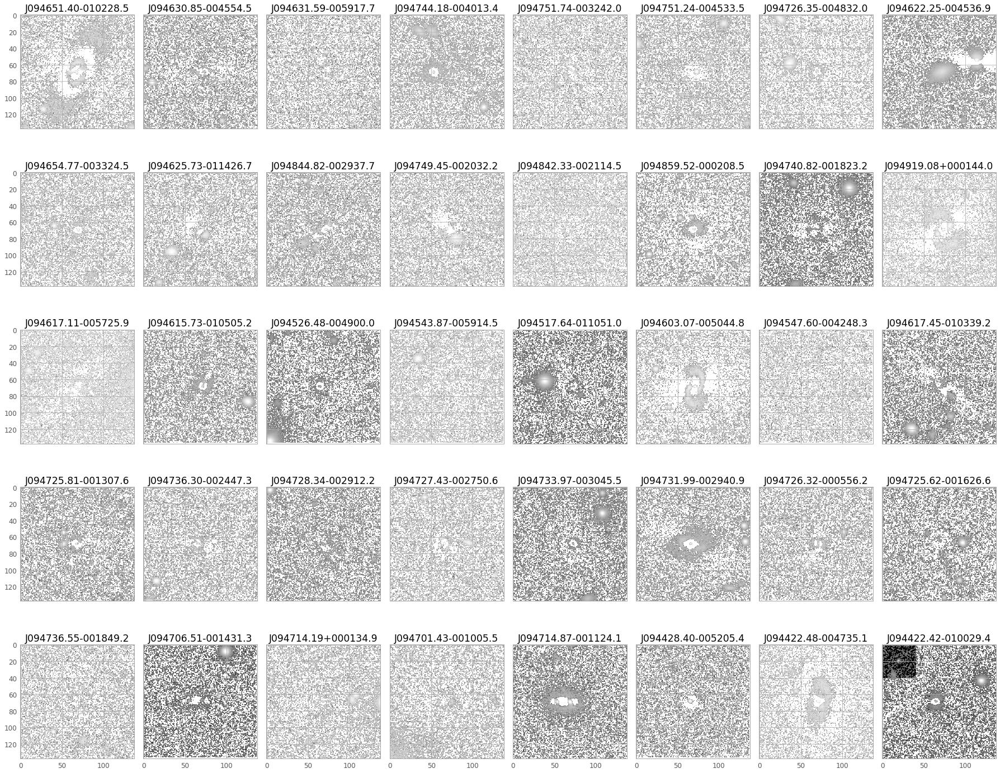

In [37]:
import warnings
warnings.filterwarnings('ignore')

fig, axes = plt.subplots(5, 8, figsize=(25, 20), sharex=True, sharey=True)
ax = axes.ravel()
i = 0

from skimage import transform
import skimage
import random


gain = 10000 # editable parameter

#PSF 
size = 20  # on each side from the center
sigma_psf = 2.0
y, x = np.mgrid[-size:size+1, -size:size+1]
psf = np.exp(-(x**2 + y**2)/(2.0*sigma_psf**2))
psf /= np.sum(psf)
plt.imshow(psf, origin='lower', cmap='gray')


for galaxy, original_img_data in nsa_galaxy_images.items():
    mean = np.nanmean(original_img_data)
    std = np.nanstd(original_img_data)
    
    
    
    image = original_img_data.copy()
    norm = colors.LogNorm()
    
    threshold = photutils.detect_threshold(image, 1.5)
    npixels = 5  # minimum number of connected pixels
    segm = photutils.detect_sources(image, threshold, npixels)


    label = np.argmax(segm.areas) + 1
    segmap = segm.data == label    
    
    segmap_float = ndi.uniform_filter(np.float64(segmap), size=10)
    segmap = segmap_float > 0.5

#     rotated_image = transform.rotate(original_img_data.byteswap().newbyteorder(), float(nsa_ang[i]),
#                                     mode='constant', cval=np.NaN)
   
#     for u in range(rotated_image.shape[0]):
#         for v in range(rotated_image.shape[1]):
#             if bool(np.isnan(rotated_image[u][v])):
#                 rotated_image[u][v] = random.gauss(mean, std)

    source_morphs = statmorph.source_morphology(image, segmap, gain=gain, psf=psf)

    morph = source_morphs[0]
    
    ny, nx = image.shape
    y, x = np.mgrid[0:ny, 0:nx]
    fitted_model = statmorph.ConvolvedSersic2D(amplitude=morph.sersic_amplitude,
                                                r_eff=morph.sersic_rhalf,
                                                n=morph.sersic_n,
                                                x_0=morph.sersic_xc,
                                                y_0=morph.sersic_yc,
                                                ellip=morph.sersic_ellip,
                                                theta=morph.sersic_theta)
    
    fitted_model.set_psf(psf)  # required when using ConvolvedSersic2D
    image_model = fitted_model(x, y)

    ax[i].set_title(galaxy)
    ax[i].imshow(image_model, cmap='gray', norm=norm)
    i += 1
    
    
plt.tight_layout()
plt.show()